# Modeling

## Injury & Kill

### Dataset: Injury & Kill

In [221]:
df_Dummy = df8.copy()
df_Dummy = df_Dummy.merge(pd.get_dummies(df_Dummy['DOW']),left_index=True,right_index=True).drop(columns=['DOW'])
df_Dummy = df_Dummy.merge(pd.get_dummies(df_Dummy['Hour']),left_index=True,right_index=True).drop(columns=['Hour'])
df_Dummy = df_Dummy.merge(pd.get_dummies(df_Dummy['VehicleType']),left_index=True,right_index=True).drop(columns=['VehicleType'])
df_Dummy = df_Dummy.merge(pd.get_dummies(df_Dummy['ContriFactor']),left_index=True,right_index=True).drop(columns=['ContriFactor'])
#df_Dummy = df_Dummy.merge(pd.get_dummies(df_Dummy['ZIPCODE']),left_index=True,right_index=True).drop(columns=['ZIPCODE'])
df_Dummy.head()

,COLLISION_ID,Num_Injured,Num_Killed,Injury,Kill,ZIPCODE,Volume,TMAX,PRCP,SNOW,...,Tow Hitch Defective,Traffic Control Device Improper/Non-Working,Traffic Control Disregarded,Turning Improperly,Unsafe Lane Changing,Unsafe Speed,Using On Board Navigation Device,Vehicle Vandalism,View Obstructed/Limited,Windshield Inadequate
0,4136992,0.0,0.0,0.0,0.0,11201,149350.0,71,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,4135881,0.0,0.0,0.0,0.0,11362,32775.0,71,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,4135881,0.0,0.0,0.0,0.0,11362,32775.0,71,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4136313,1.0,0.0,1.0,0.0,11377,175863.0,71,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,4136313,1.0,0.0,1.0,0.0,11377,175863.0,71,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [222]:
scaler = MinMaxScaler()
df_Dummy[['Volume','TMAX','PRCP','SNOW']] = scaler.fit_transform(df_Dummy[['Volume','TMAX','PRCP','SNOW']])

In [223]:
df_Dummy = df_Dummy[df_Dummy['ZIPCODE']==10019]
#df_Dummy = df_Dummy[df_Dummy['ZIPCODE']==11236]
df_Dummy

,COLLISION_ID,Num_Injured,Num_Killed,Injury,Kill,ZIPCODE,Volume,TMAX,PRCP,SNOW,...,Tow Hitch Defective,Traffic Control Device Improper/Non-Working,Traffic Control Disregarded,Turning Improperly,Unsafe Lane Changing,Unsafe Speed,Using On Board Navigation Device,Vehicle Vandalism,View Obstructed/Limited,Windshield Inadequate
30,4136510,1.0,0.0,1.0,0.0,10019,0.211921,0.698795,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
31,4136510,1.0,0.0,1.0,0.0,10019,0.211921,0.698795,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
849,4408441,1.0,0.0,1.0,0.0,10019,0.071201,0.457831,0.024138,0.0,...,0,0,0,0,0,0,0,0,0,0
1410,4312828,0.0,0.0,0.0,0.0,10019,0.184166,0.614458,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
1727,4375694,0.0,0.0,0.0,0.0,10019,0.206865,0.590361,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603173,3822624,0.0,0.0,0.0,0.0,10019,0.184166,0.204819,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
603174,3822624,0.0,0.0,0.0,0.0,10019,0.184166,0.204819,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
603175,3822624,0.0,0.0,0.0,0.0,10019,0.184166,0.204819,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
603382,3824947,2.0,0.0,1.0,0.0,10019,0.203369,0.060241,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0


In [224]:
final = df_Dummy.copy()

In [226]:
final = final.fillna(0)

### Number Injuries

In [170]:
X = final.iloc[:,6:]
y = final.iloc[:,1]

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)

In [173]:
rfr = RandomForestRegressor(random_state=42, bootstrap=True) 
rfr.fit(X_train, y_train)
rfr.score(X_test, y_test)

0.6361879337668732

In [174]:
y_pred = rfr.predict(X_test)
RMSE=(np.mean(((y_pred - y_test))**2))**0.5
print(RMSE)

0.601927469043364


Text(0.5, 0, 'Relative Importance')

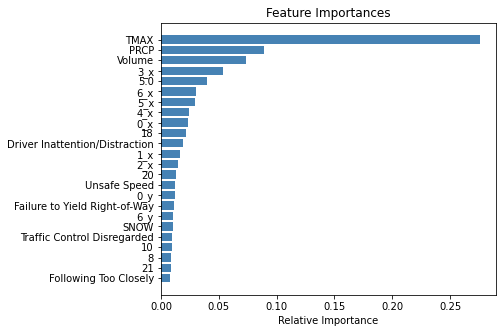

In [177]:
importances = rfr.feature_importances_
indices = np.argsort(importances)[70:]

import matplotlib.pyplot as plt
plt.figure(figsize=(6,5))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='steelblue', align='center')
plt.yticks(range(len(indices)), np.array(X.columns)[indices])
plt.xlabel('Relative Importance')
# plt.savefig("Feature_importance.png")

### Number Killed

In [206]:
X = final.iloc[:,6:]
y = final.iloc[:,2]

In [207]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [208]:
rfr = RandomForestRegressor(random_state=42, bootstrap=True) 
rfr.fit(X_train, y_train)
rfr.score(X_test, y_test)

0.39843439319301377

In [209]:
y_pred = rfr.predict(X_test)
RMSE=(np.mean(((y_pred - y_test))**2))**0.5
print(RMSE)

0.04328992789486785


In [210]:
rfr.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

Text(0.5, 0, 'Relative Importance')

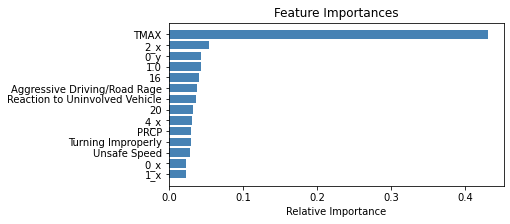

In [211]:
importances = rfr.feature_importances_
indices = np.argsort(importances)[80:]

import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='steelblue', align='center')
plt.yticks(range(len(indices)), np.array(X.columns)[indices])
plt.xlabel('Relative Importance')
# plt.savefig("Feature_importance.png")

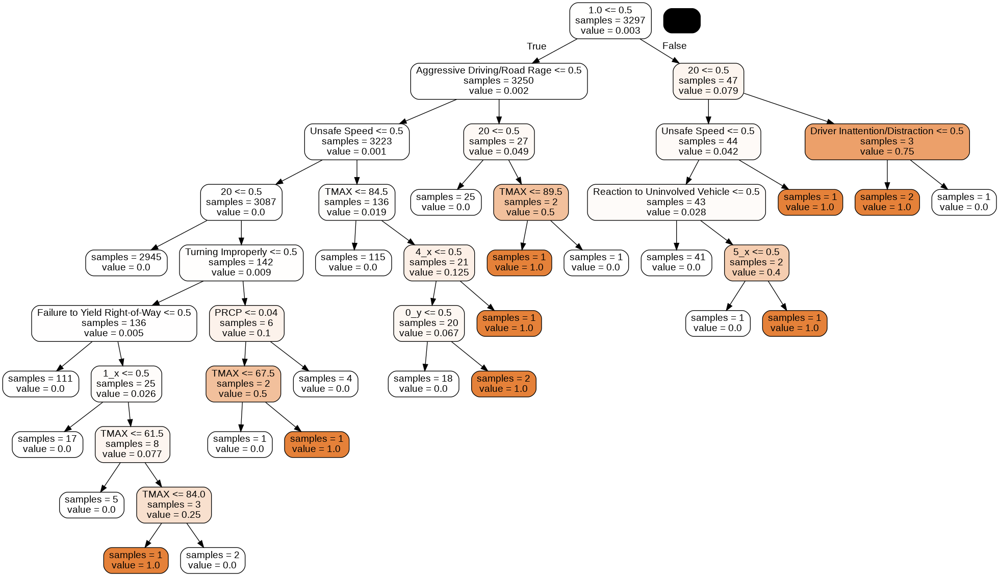

In [212]:
from sklearn import tree
import pydotplus
dt1 = rfr.estimators_[0]
#dt2 = rfr.estimators_[1]

# tree 1 
thestring = tree.export_graphviz(dt1, out_file=None,  
                         feature_names=X_train.columns.values,
                         class_names=[0,1,2,3,4,5,7],  
                         filled=True, rounded=True,  
                         special_characters=False,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())

### Whether Injured

In [228]:
X = final.iloc[:,6:]
y = final.iloc[:,3]

In [230]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [231]:
rfr = RandomForestClassifier(random_state=42)
rfr.fit(X_train, y_train)
rfr.score(X_test, y_test)

0.9358974358974359

Text(0.5, 0, 'Relative Importance')

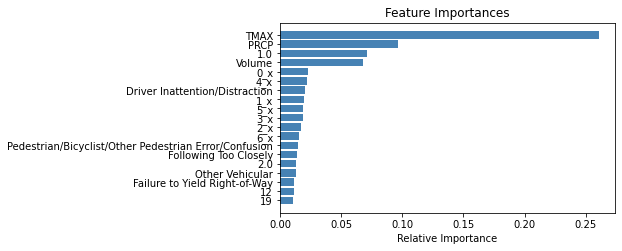

In [232]:
importances = rfr.feature_importances_
indices = np.argsort(importances)[75:]

import matplotlib.pyplot as plt
plt.figure(figsize=(6,3.5))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='steelblue', align='center')
plt.yticks(range(len(indices)), np.array(X.columns)[indices])
plt.xlabel('Relative Importance')
# plt.savefig("Feature_importance.png")

In [233]:
dt1 = rfr.estimators_[0]
#dt2 = rfr.estimators_[1]

# tree 1 
thestring = tree.export_graphviz(dt1, out_file=None,  
                         feature_names=X_train.columns.values, class_names=['injured','non-injured'], 
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())

### Whether Killed

In [50]:
X = final.iloc[:,5:99]
y = final.iloc[:,4]

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [52]:
rfr = RandomForestClassifier(max_depth=2, random_state=42)
rfr.fit(X_train, y_train)
rfr.score(X_test, y_test)

0.9990282578208681

In [62]:
final.head()

,COLLISION_ID,Num_Injured,Num_Killed,Injury,Kill,Volume,TMAX,PRCP,SNOW,0_x,...,11433,11434,11435,11436,11691,11692,11693,11694,11695,11697
0,4136992,0.0,0.0,0.0,0.0,0.356775,0.698795,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,4135881,0.0,0.0,0.0,0.0,0.077998,0.698795,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
2,4135881,0.0,0.0,0.0,0.0,0.077998,0.698795,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
3,4136313,1.0,0.0,1.0,0.0,0.420178,0.698795,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
4,4136313,1.0,0.0,1.0,0.0,0.420178,0.698795,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0


Text(0.5, 0, 'Relative Importance')

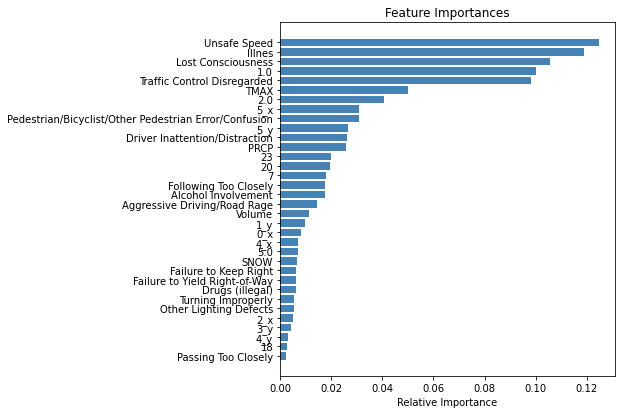

In [57]:
importances = rfr.feature_importances_
indices = np.argsort(importances)[60:]

import matplotlib.pyplot as plt
plt.figure(figsize=(6,6.5))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='steelblue', align='center')
plt.yticks(range(len(indices)), np.array(X.columns)[indices])
plt.xlabel('Relative Importance')
# plt.savefig("Feature_importance.png")

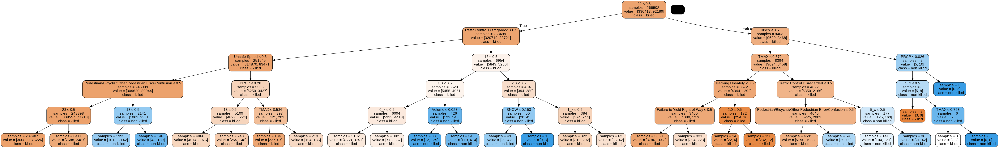

In [72]:
dt2 = rfr.estimators_[0]
#dt2 = rfr.estimators_[1]

# tree 1 
thestring = tree.export_graphviz(dt1, out_file=None,  
                         feature_names=X_train.columns.values, class_names=['killed','non-killed'], 
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())